# Install Detectron2 Dependencies

In [ ]:
!pip install pyyaml==5.1

# Install Detectron2 dependencies
import torch

TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print(f"torch: {TORCH_VERSION}; cuda: {CUDA_VERSION}")

!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 14.6 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch: 2.5; cuda: cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-63tcoqms
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-63tcoqms
  Resolved https://github.com/facebookresearch/detectron2.git to commit 8d85329aed8506ea3672e3e208971345973ea761
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Setup Detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Import other common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# Import Detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog


# Import and Register Custom Detectron2 Data

In [ ]:
# Replace with your dataset download command
!curl -L "https://public.roboflow.com/ds/XkvpQoqxCi?key=eNAflyazE4" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1724      0 --:--:-- --:--:-- --:--:--  1722
100 68.0M  100 68.0M    0     0  10.1M      0  0:00:06  0:00:06 --:--:-- 15.2M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg  
 extracting: test/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg  
 extracting: test/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg  
 extracting: test/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg  
 extracting: test/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg  
 extracting: test/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c305849.jpg  
 extracting: test/IMG_2379_jpeg_jpg.rf.7dc3160c937072d26d4624c6c48e904d.jpg  
 extracting: test/IM

In [ ]:
from detectron2.data.datasets import register_coco_instances

# Register the COCO format dataset
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_test", {}, "/content/valid/_annotations.coco.json", "/content/valid")


WARNING [11/05 09:43:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/05 09:43:58 d2.data.datasets.coco]: Loaded 448 images in COCO format from /content/train/_annotations.coco.json


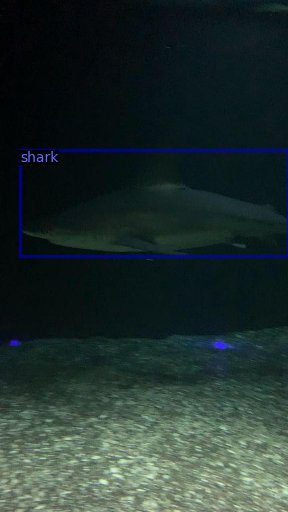

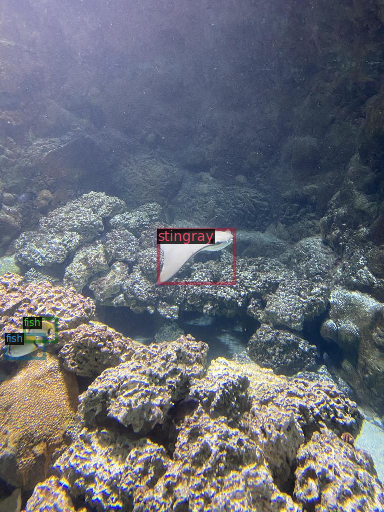

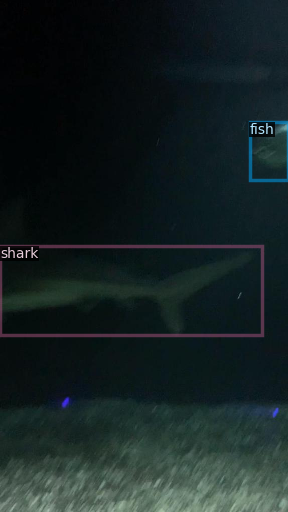

In [ ]:
# Visualize some samples from the training dataset
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])


# Train Custom Detectron2 Detector

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_test",)
cfg.DATALOADER.NUM_WORKERS = 2

# Initialize from the Model Zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

# Set training parameters
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # Adjust if necessary
cfg.SOLVER.MAX_ITER = 500    # Adjust based on dataset size
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7  # Replace with the number of classes in your dataset

# Create output directory for saving model checkpoints
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)  # Start training from scratch
trainer.train()


[11/05 09:44:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 227MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[11/05 09:44:01 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/05 09:44:13 d2.utils.events]:  eta: 0:03:05  iter: 19  total_loss: 2.96  loss_cls: 2.036  loss_box_reg: 0.7493  loss_rpn_cls: 0.07836  loss_rpn_loc: 0.02643    time: 0.3946  last_time: 0.4986  data_time: 0.0255  last_data_time: 0.0145   lr: 9.7405e-05  max_mem: 2638M
[11/05 09:44:25 d2.utils.events]:  eta: 0:02:56  iter: 39  total_loss: 2.005  loss_cls: 0.9758  loss_box_reg: 0.745  loss_rpn_cls: 0.07962  loss_rpn_loc: 0.04382    time: 0.4150  last_time: 0.5492  data_time: 0.0151  last_data_time: 0.0222   lr: 0.00019731  max_mem: 2638M
[11/05 09:44:34 d2.utils.events]:  eta: 0:02:54  iter: 59  total_loss: 1.62  loss_cls: 0.729  loss_box_reg: 0.7638  loss_rpn_cls: 0.02814  loss_rpn_loc: 0.01576    time: 0.4213  last_time: 0.3594  data_time: 0.0209  last_data_time: 0.0046   lr: 0.0002972  max_mem: 2638M
[11/05 09:44:44 d2.utils.events]:  eta: 0:02:57  iter: 79  total_loss: 1.454  loss_cls: 0.6296  loss_box_reg: 0.7516  loss_rpn_cls: 0.04247  loss_rpn_loc: 0.03102    time: 0.4391  last

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
# Load the trained model and set the testing threshold
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # Set threshold for the model
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)


[11/05 09:47:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

# Inference with Detectron2 Saved Weights



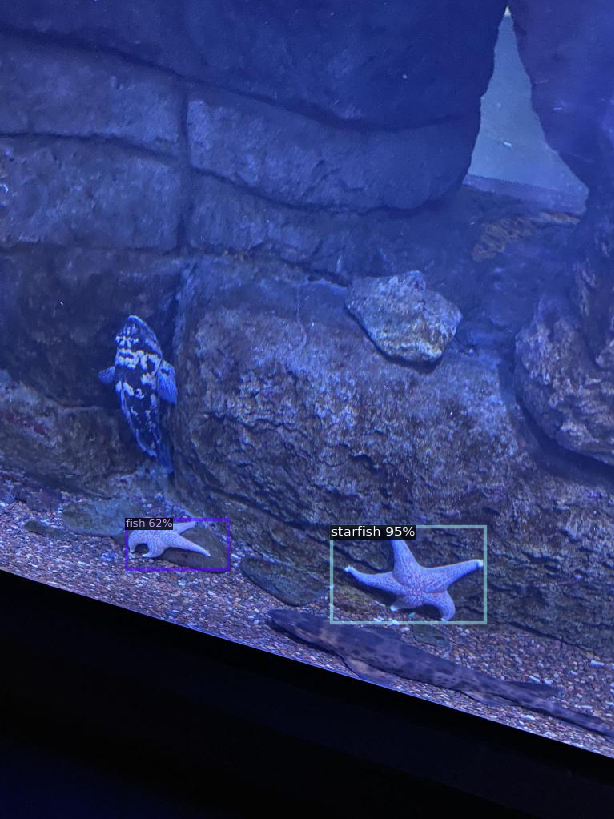

In [ ]:
# Define the metadata for test dataset
test_metadata = MetadataCatalog.get("my_dataset_test")

import glob

# Run inference on test images and display results
for imageName in glob.glob('/content/valid/*.jpg'):
    im = cv2.imread(imageName)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.SEGMENTATION   # Remove colors of unsegmented pixels
                   )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


# Evaluation

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Initialize COCO Evaluator for the test set
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")

# Run evaluation
print(inference_on_dataset(predictor.model, val_loader, evaluator))


WARNING [11/05 09:48:46 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/05 09:48:46 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/05 09:48:46 d2.data.datasets.coco]: Loaded 127 images in COCO format from /content/valid/_annotations.coco.json
[11/05 09:48:46 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/05 09:48:46 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/05 09:48:46 d2.data.common]: Serializing 127 elements to byte tensors and concatenating them all ...
[11/05 09:48:46 d2.data.common]: Serialized dataset takes 0.06 MiB
[11/05 09:48:46 d2.evaluation.evaluator]: Start inference on 127 batches
[11/05 09:48:47 d2.evaluation.eval

In [ ]:
# Save

In [ ]:
# Save the configuration to a YAML file for future reference
with open('config.yml', 'w') as f:
    f.write(cfg.dump())


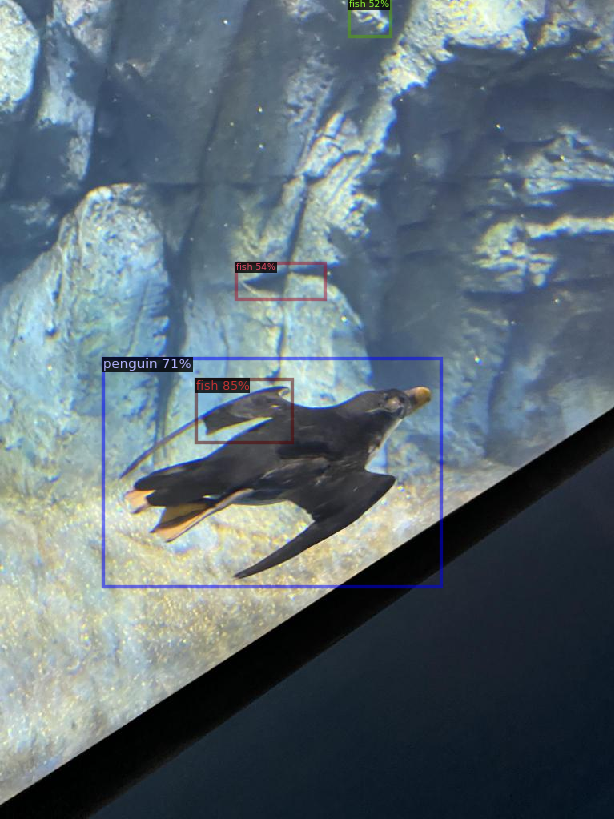

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def detect_and_display(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Run the predictor on the image
    outputs = predictor(image)

    # Visualize the predictions
    visualizer = Visualizer(image[:, :, ::-1], metadata=test_metadata, scale=0.8)
    vis_output = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Display the image with predictions
    cv2_imshow(vis_output.get_image()[:, :, ::-1])

# Example usage
detect_and_display("/content/test/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg")
